In [1]:
import numpy as np
import matplotlib.pyplot as plt
import os

from joblib import Parallel, delayed, parallel_backend
# from psiam_tied_dv_map_utils_for_noise import psiam_tied_data_gen_wrapper_noise_change_no_L_T0_change
from psiam_tied_dv_map_utils_with_PDFs import all_RTs_fit_OPTIM_V_A_change_added_noise_fn, up_RTs_fit_OPTIM_V_A_change_added_noise_fn, down_RTs_fit_OPTIM_V_A_change_added_noise_fn, PA_with_LEDON_2
from psiam_tied_dv_map_utils_with_PDFs import up_RTs_fit_OPTIM_V_A_change_gamma_omega_fn, down_RTs_fit_OPTIM_V_A_change_gamma_omega_fn
import pandas as pd
import random
from tqdm.notebook import tqdm
from joblib import Parallel, delayed
from scipy.integrate import trapezoid as trapz
from pyvbmc import VBMC
import corner
from diagnostics_class import Diagnostics
from psiam_tied_dv_map_utils_with_PDFs import all_RTs_fit_OPTIM_fn, CDF_RT_fn
from scipy.integrate import cumulative_trapezoid as cumtrapz
import pickle
from single_cond_utils import PA_with_LEDON_2_VEC
from psiam_tied_dv_map_utils_with_PDFs import up_RTs_fit_OPTIM_V_A_change_gamma_omega_P_A_C_A_wrt_stim_fn
from psiam_tied_dv_map_utils_with_PDFs import down_RTs_fit_OPTIM_V_A_change_gamma_omega_P_A_C_A_wrt_stim_fn
from psiam_tied_dv_map_utils_with_PDFs import all_RTs_fit_OPTIM_omega_gamma_PA_CA_wrt_stim_fn

import io
import matplotlib.gridspec as gridspec
import corner

In [2]:
# repeat_trial, T16, S7
og_df = pd.read_csv('../out_LED.csv')
df = og_df[ og_df['repeat_trial'].isin([0,2]) | og_df['repeat_trial'].isna() ]
session_type = 7    
df = df[ df['session_type'].isin([session_type]) ]
training_level = 16
df = df[ df['training_level'].isin([training_level]) ]


# t_stim, t_LED, ABL, ILD
t_stim_and_led_tuple = [(row['intended_fix'], row['intended_fix'] - row['LED_onset_time']) for _, row in df.iterrows()]
ABL_arr = df['ABL'].unique(); ABL_arr.sort()
ILD_arr = df['ILD'].unique(); ILD_arr.sort()


# 1 is right , -1 is left
df['choice'] = df['response_poke'].apply(lambda x: 1 if x == 3 else (-1 if x == 2 else random.choice([1, -1])))
# 1 or 0 if the choice was correct or not
df['correct'] = (df['ILD'] * df['choice']).apply(lambda x: 1 if x > 0 else 0)


In [3]:
# LED OFF
df_led_off = df[df['LED_trial'] == 0]
print(f'len of LED off: {len(df_led_off)}')

# valid trials
df_led_off_valid_trials = df_led_off[df_led_off['success'].isin([1,-1])]
print(f'len of led off valid trials = {len(df_led_off_valid_trials)}')

# remove trials with RT > 1s
df_led_off_valid_trials = df_led_off_valid_trials[df_led_off_valid_trials['timed_fix'] - df_led_off_valid_trials['intended_fix'] < 1]
print(f'len of valid trials < 1s : {len(df_led_off_valid_trials)}')

len of LED off: 66226
len of led off valid trials = 53472
len of valid trials < 1s : 52799


In [4]:
## VBMC params
# Proactive params
V_A = 1.6
theta_A = 2.53
V_A_post_LED = V_A # LED OFF

# delays
t_A_aff = -0.187
del_go = 0.13 

# other params
Z_E = 0
K_max = 10

# LED Off - no noise
noise = 0
t_E_aff = 0.068 # 68 ms

In [5]:
def compute_loglike_trial(row, gamma, omega, t_E_aff):
    # data
    rt = row['timed_fix']
    t_stim = row['intended_fix']
    t_LED = row['intended_fix'] - row['LED_onset_time']

    response_poke = row['response_poke']
    

    t_pts = np.arange(t_stim, t_stim + 1, 0.001)
    P_A_LED_change = np.array([PA_with_LEDON_2(i, V_A, V_A_post_LED, theta_A, 0, t_LED, t_A_aff) for i in t_pts])
    area_btn_stim_and_1s = trapz(P_A_LED_change, t_pts)
    trunc_factor_p_joint = area_btn_stim_and_1s
        
    if response_poke == 3:
        # up
        P_joint_rt_choice = up_RTs_fit_OPTIM_V_A_change_gamma_omega_fn(rt, t_LED, V_A, V_A_post_LED, theta_A,\
                                                                    gamma, omega, t_stim, t_A_aff, t_E_aff, del_go, K_max)
    elif response_poke == 2:
        # down
        P_joint_rt_choice = down_RTs_fit_OPTIM_V_A_change_gamma_omega_fn(rt, t_LED, V_A, V_A_post_LED, theta_A,\
                                                                    gamma, omega, t_stim, t_A_aff, t_E_aff, del_go, K_max)
    

    
    P_joint_rt_choice_trunc = max(P_joint_rt_choice / (trunc_factor_p_joint + 1e-10), 1e-10)
    
    wt_log_like = np.log(P_joint_rt_choice_trunc)


    return wt_log_like


In [6]:
omega_bounds = [0.05, 50]
omega_plausible_bounds = [0.5, 10]

In [7]:
def trapezoidal_logpdf(x, a, b, c, d):
    if x < a or x > d:
        return -np.inf  # Logarithm of zero
    area = ((b - a) + (d - c)) / 2 + (c - b)
    h_max = 1.0 / area  # Height of the trapezoid to normalize the area to 1
    
    if a <= x <= b:
        pdf_value = ((x - a) / (b - a)) * h_max
    elif b < x < c:
        pdf_value = h_max
    elif c <= x <= d:
        pdf_value = ((d - x) / (d - c)) * h_max
    else:
        pdf_value = 0.0  # This case is redundant due to the initial check

    if pdf_value <= 0.0:
        return -np.inf
    else:
        return np.log(pdf_value)
    

def vbmc_prior_fn(params):
    gamma, omega = params
    gamma_logpdf = trapezoidal_logpdf(gamma, gamma_bounds[0], gamma_plausible_bounds[0], gamma_plausible_bounds[1], gamma_bounds[1])
    omega_logpdf = trapezoidal_logpdf(omega, omega_bounds[0], omega_plausible_bounds[0], omega_plausible_bounds[1], omega_bounds[1])
    return gamma_logpdf + omega_logpdf

++++++++++ ABL = 20, ILD = 1.0 +++++++++++++++++++++
Reshaping x0 to row vector.
Reshaping lower bounds to (1, 2).
Reshaping upper bounds to (1, 2).
Reshaping plausible lower bounds to (1, 2).
Reshaping plausible upper bounds to (1, 2).
Casting upper bounds to floating point.


/home/rlab/raghavendra/ddm_data/.venv/lib/python3.12/site-packages/cma/evolution_strategy.py:3379: RuntimeWarning: invalid value encountered in scalar subtract
  current_fitness_range < opts['tolfunrel'] * (es.fit.median0 - es.fit.median_min),
/home/rlab/raghavendra/ddm_data/.venv/lib/python3.12/site-packages/cma/evolution_strategy.py:3379: RuntimeWarning: invalid value encountered in scalar multiply
  current_fitness_range < opts['tolfunrel'] * (es.fit.median0 - es.fit.median_min),


Inference terminated: variational solution stable for options.tol_stable_count fcn evaluations.
Estimated ELBO: 341.514 +/-0.001.
++++++++++ ABL = 20, ILD = -1.0 +++++++++++++++++++++
Reshaping x0 to row vector.
Reshaping lower bounds to (1, 2).
Reshaping upper bounds to (1, 2).
Reshaping plausible lower bounds to (1, 2).
Reshaping plausible upper bounds to (1, 2).
Inference terminated: variational solution stable for options.tol_stable_count fcn evaluations.
Estimated ELBO: 274.148 +/-0.001.
++++++++++ ABL = 20, ILD = 2.0 +++++++++++++++++++++
Reshaping x0 to row vector.
Reshaping lower bounds to (1, 2).
Reshaping upper bounds to (1, 2).
Reshaping plausible lower bounds to (1, 2).
Reshaping plausible upper bounds to (1, 2).
Casting upper bounds to floating point.


/home/rlab/raghavendra/ddm_data/.venv/lib/python3.12/site-packages/cma/evolution_strategy.py:3379: RuntimeWarning: invalid value encountered in scalar subtract
  current_fitness_range < opts['tolfunrel'] * (es.fit.median0 - es.fit.median_min),
/home/rlab/raghavendra/ddm_data/.venv/lib/python3.12/site-packages/cma/evolution_strategy.py:3379: RuntimeWarning: invalid value encountered in scalar multiply
  current_fitness_range < opts['tolfunrel'] * (es.fit.median0 - es.fit.median_min),


Inference terminated: variational solution stable for options.tol_stable_count fcn evaluations.
Estimated ELBO: 630.671 +/-0.001.
++++++++++ ABL = 20, ILD = -2.0 +++++++++++++++++++++
Reshaping x0 to row vector.
Reshaping lower bounds to (1, 2).
Reshaping upper bounds to (1, 2).
Reshaping plausible lower bounds to (1, 2).
Reshaping plausible upper bounds to (1, 2).
Inference terminated: variational solution stable for options.tol_stable_count fcn evaluations.
Estimated ELBO: 448.568 +/-0.001.
++++++++++ ABL = 20, ILD = 4.0 +++++++++++++++++++++
Reshaping x0 to row vector.
Reshaping lower bounds to (1, 2).
Reshaping upper bounds to (1, 2).
Reshaping plausible lower bounds to (1, 2).
Reshaping plausible upper bounds to (1, 2).
Casting upper bounds to floating point.
Inference terminated: variational solution stable for options.tol_stable_count fcn evaluations.
Estimated ELBO: 1242.168 +/-0.001.
++++++++++ ABL = 20, ILD = -4.0 +++++++++++++++++++++
Reshaping x0 to row vector.
Reshaping lo

/home/rlab/raghavendra/ddm_data/.venv/lib/python3.12/site-packages/corner/core.py:126: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


++++++++++ ABL = 60, ILD = 1.0 +++++++++++++++++++++
Reshaping x0 to row vector.
Reshaping lower bounds to (1, 2).
Reshaping upper bounds to (1, 2).
Reshaping plausible lower bounds to (1, 2).
Reshaping plausible upper bounds to (1, 2).
Casting upper bounds to floating point.
Inference terminated: variational solution stable for options.tol_stable_count fcn evaluations.
Estimated ELBO: 1367.847 +/-0.001.


/home/rlab/raghavendra/ddm_data/.venv/lib/python3.12/site-packages/corner/core.py:126: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))
/tmp/ipykernel_86651/786320855.py:203: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(30, 8))


++++++++++ ABL = 60, ILD = -1.0 +++++++++++++++++++++
Reshaping x0 to row vector.
Reshaping lower bounds to (1, 2).
Reshaping upper bounds to (1, 2).
Reshaping plausible lower bounds to (1, 2).
Reshaping plausible upper bounds to (1, 2).
Inference terminated: variational solution stable for options.tol_stable_count fcn evaluations.
Estimated ELBO: 1244.215 +/-0.001.
++++++++++ ABL = 60, ILD = 2.0 +++++++++++++++++++++
Reshaping x0 to row vector.
Reshaping lower bounds to (1, 2).
Reshaping upper bounds to (1, 2).
Reshaping plausible lower bounds to (1, 2).
Reshaping plausible upper bounds to (1, 2).
Casting upper bounds to floating point.
Inference terminated: variational solution stable for options.tol_stable_count fcn evaluations.
Estimated ELBO: 1711.037 +/-0.001.
++++++++++ ABL = 60, ILD = -2.0 +++++++++++++++++++++
Reshaping x0 to row vector.
Reshaping lower bounds to (1, 2).
Reshaping upper bounds to (1, 2).
Reshaping plausible lower bounds to (1, 2).
Reshaping plausible upper bou

/home/rlab/raghavendra/ddm_data/.venv/lib/python3.12/site-packages/cma/evolution_strategy.py:3379: RuntimeWarning: invalid value encountered in scalar subtract
  current_fitness_range < opts['tolfunrel'] * (es.fit.median0 - es.fit.median_min),
/home/rlab/raghavendra/ddm_data/.venv/lib/python3.12/site-packages/cma/evolution_strategy.py:3379: RuntimeWarning: invalid value encountered in scalar multiply
  current_fitness_range < opts['tolfunrel'] * (es.fit.median0 - es.fit.median_min),


Inference terminated: variational solution stable for options.tol_stable_count fcn evaluations.
Estimated ELBO: 2151.740 +/-0.001.
++++++++++ ABL = 60, ILD = -4.0 +++++++++++++++++++++
Reshaping x0 to row vector.
Reshaping lower bounds to (1, 2).
Reshaping upper bounds to (1, 2).
Reshaping plausible lower bounds to (1, 2).
Reshaping plausible upper bounds to (1, 2).
Inference terminated: variational solution stable for options.tol_stable_count fcn evaluations.
Estimated ELBO: 1692.888 +/-0.001.
++++++++++ ABL = 60, ILD = 8.0 +++++++++++++++++++++
Reshaping x0 to row vector.
Reshaping lower bounds to (1, 2).
Reshaping upper bounds to (1, 2).
Reshaping plausible lower bounds to (1, 2).
Reshaping plausible upper bounds to (1, 2).
Casting upper bounds to floating point.
Inference terminated: variational solution stable for options.tol_stable_count fcn evaluations.
Estimated ELBO: 2990.096 +/-0.001.
++++++++++ ABL = 60, ILD = -8.0 +++++++++++++++++++++
Reshaping x0 to row vector.
Reshaping 

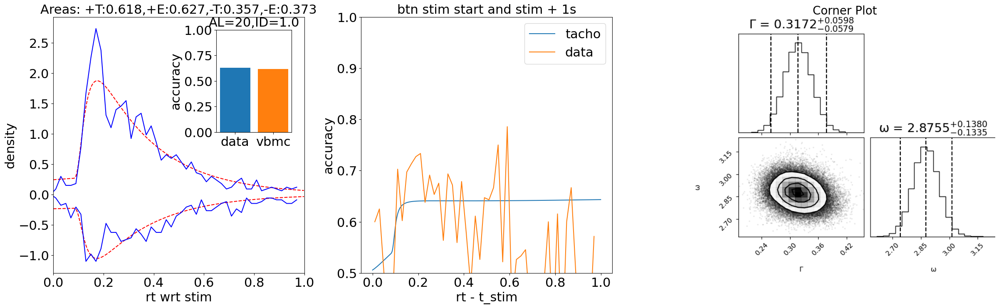

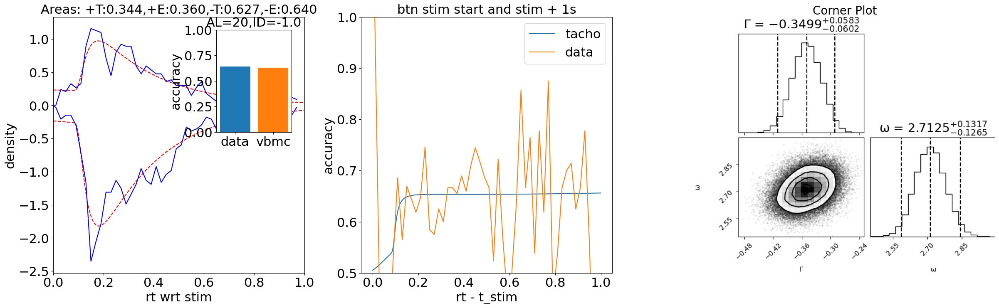

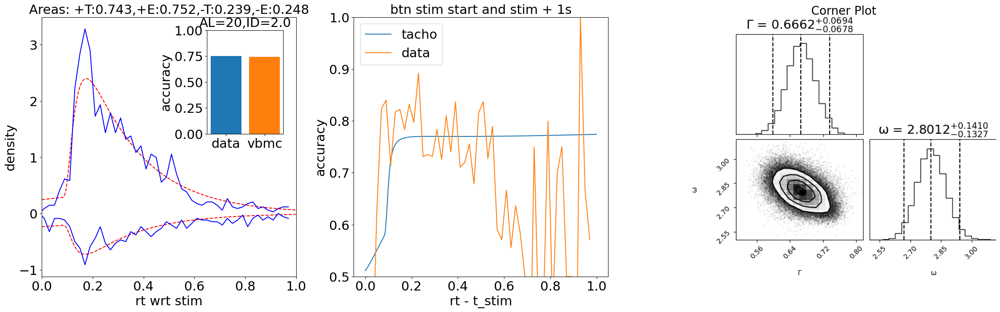

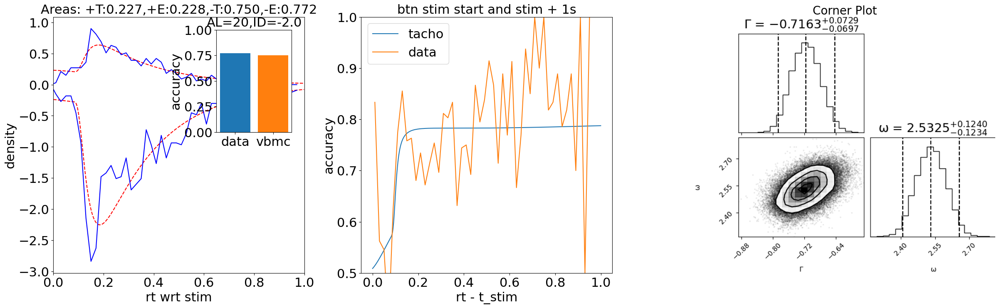

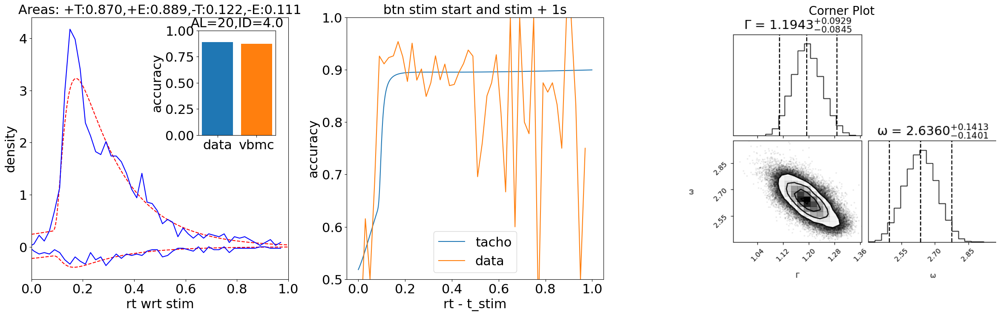

...

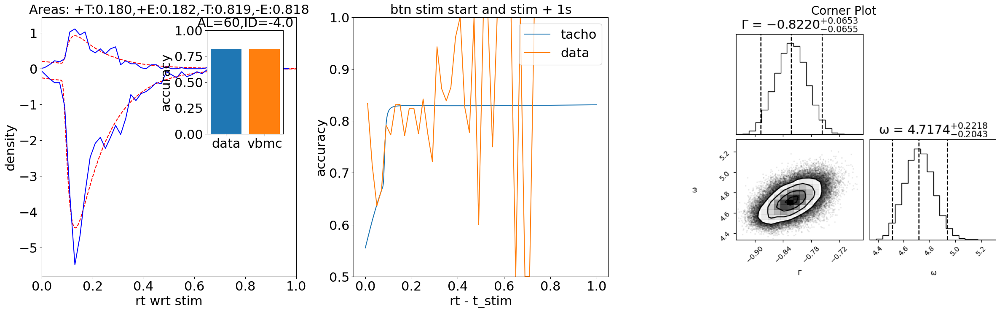

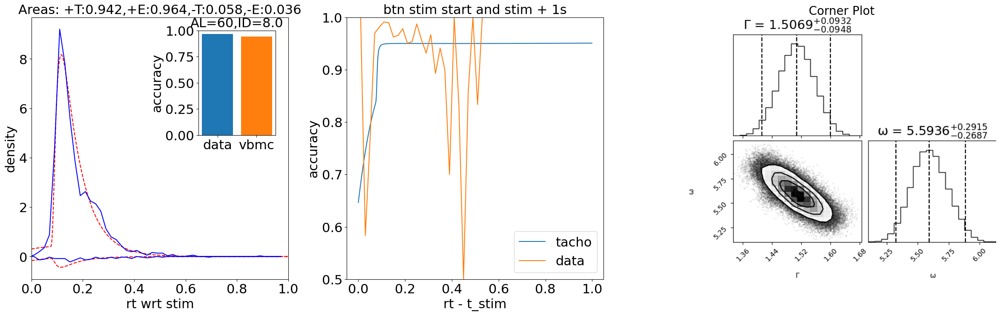

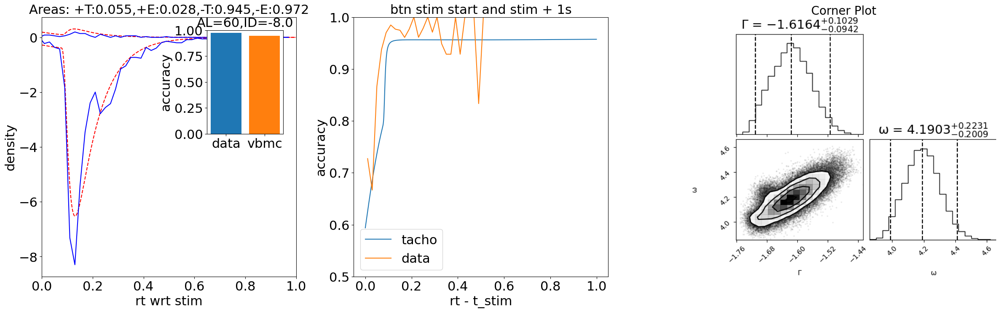

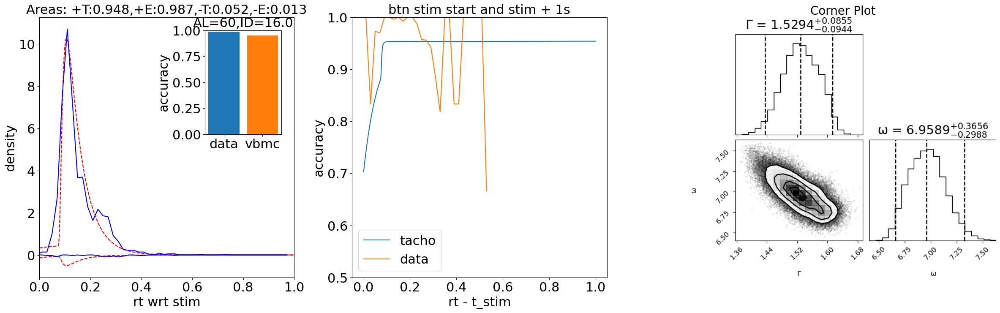

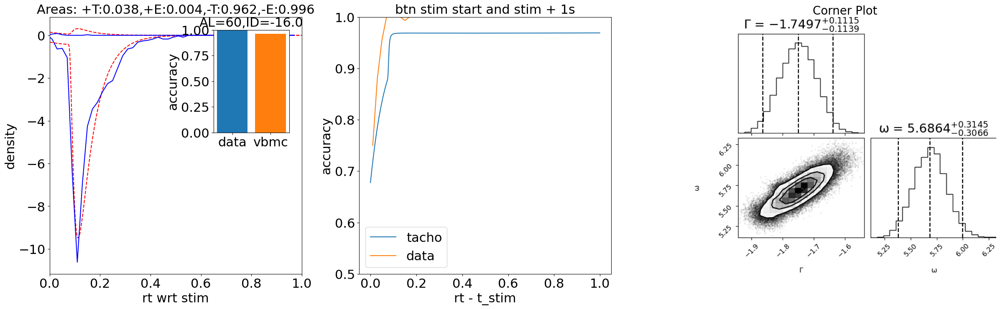

In [8]:
all_ABLs_cond = [20, 40, 60]
all_ILDs_cond = [1., -1., 2., -2., 4., -4., 8., -8., 16., -16.]

for cond_ABL in all_ABLs_cond:
    for cond_ILD in all_ILDs_cond:
        conditions = {'ABL': [cond_ABL], 'ILD': [cond_ILD]}

        # Applying the filter
        df_led_off_valid_trials_cond_filtered = df_led_off_valid_trials[
            (df_led_off_valid_trials['ABL'].isin(conditions['ABL'])) & 
            (df_led_off_valid_trials['ILD'].isin(conditions['ILD']))
        ]

        def vbmc_loglike_fn(params):
            gamma, omega = params

            all_loglike = Parallel(n_jobs=30)(delayed(compute_loglike_trial)(row, gamma, omega, t_E_aff) \
                                            for _, row in df_led_off_valid_trials_cond_filtered.iterrows())
            
            return np.sum(all_loglike)
        
        def vbmc_joint_fn(params):
            priors = vbmc_prior_fn(params)
            loglike = vbmc_loglike_fn(params)

            return priors + loglike

        
        print(f'++++++++++ ABL = {cond_ABL}, ILD = {cond_ILD} +++++++++++++++++++++')
        if cond_ILD > 0:
            gamma_bounds = [0.001, 5]
            gamma_plausible_bounds = [0.09, 0.9]
        elif cond_ILD < 0:
            gamma_bounds = [-5, -0.001]
            gamma_plausible_bounds = [-0.9, -0.09]
            

        lb = np.array([gamma_bounds[0], omega_bounds[0]])
        ub = np.array([gamma_bounds[1], omega_bounds[1]])

        plb = np.array([gamma_plausible_bounds[0], omega_plausible_bounds[0]])
        pub = np.array([gamma_plausible_bounds[1], omega_plausible_bounds[1]])

        # Initialize with random values within plausible bounds
        np.random.seed(42)
        gamma_0 = np.random.uniform(gamma_plausible_bounds[0], gamma_plausible_bounds[1])
        omega_0 = np.random.uniform(omega_plausible_bounds[0], omega_plausible_bounds[1])

        x_0 = np.array([gamma_0, omega_0])

        vbmc = VBMC(vbmc_joint_fn, x_0, lb, ub, plb, pub, options={'display': 'off'})
        vp, results = vbmc.optimize()

        vbmc.save(f'each_cond_data/t_E_fixed_vbmc_single_condn_ABL_{cond_ABL}_ILD_{cond_ILD}.pkl', overwrite=True)

        vp_samples = vp.sample(int(1e5))[0]

        gamma_samples = vp_samples[:, 0]
        omega_samples = vp_samples[:, 1]

        gamma = gamma_samples.mean()
        omega = omega_samples.mean()


        # plot the corner plot
        corner_samples = np.vstack([gamma_samples, omega_samples]).T
        percentiles = np.percentile(corner_samples, [0, 100], axis=0)
        _ranges = [(percentiles[0, i], percentiles[1, i]) for i in np.arange(corner_samples.shape[1])]
        param_labels = [ 'gamma', 'omega']

        fig_corner = corner.corner(
            corner_samples,
            labels=param_labels,
            show_titles=True,
            quantiles=[0.025, 0.5, 0.975],
            range=_ranges,
            title_fmt=".4f"
        );

        filename = f"t_E_fixed_corner_each_cond_ABL_{cond_ABL}_ILD_{cond_ILD}.png"
        save_path = os.path.join("each_cond_data", filename)

        # Make sure the directory exists
        os.makedirs("each_cond_data", exist_ok=True)

        # Save the figure
        fig_corner.savefig(save_path, dpi=300, bbox_inches='tight')
        plt.close(fig_corner)

        ### Diagnostics
        # DATA
        df_led_off = df[df['LED_trial'] == 0]

        # < 1s RTs
        df_led_off = df_led_off[df_led_off['timed_fix'] - df_led_off['intended_fix'] < 1]
        # remove truncated aborts
        data_df_led_off_with_aborts = df_led_off[ ~( (df_led_off['abort_event'] == 3) & (df_led_off['timed_fix'] < 0.3) ) ]
        # renaming
        data_df_led_off_with_aborts = data_df_led_off_with_aborts.rename(
            columns={'timed_fix': 'rt', 'intended_fix': 't_stim'}
        )

        ### ABORTS + VALID TRIALS + ABL, ILD CONDITION
        data_df_led_off_with_aborts_cond_filtered = data_df_led_off_with_aborts[
            (data_df_led_off_with_aborts['ABL'].isin(conditions['ABL'])) & 
            (data_df_led_off_with_aborts['ILD'].isin(conditions['ILD']))
        ]

        data_df_led_off_valid = data_df_led_off_with_aborts[ data_df_led_off_with_aborts['success'].isin([1,-1]) ]

        # VALID TRIALS CONDITION
        df_led_off_valid_trials_cond_filtered = data_df_led_off_valid[
            (data_df_led_off_valid['ABL'].isin(conditions['ABL'])) & 
            (data_df_led_off_valid['ILD'].isin(conditions['ILD']))
        ]

        df_led_off_valid_trials_cond_filtered['ABL'].unique(), df_led_off_valid_trials_cond_filtered['ILD'].unique()


        ## Up and down RT
        # PA_with_LEDON_2(t, v, vON, a, tfix, tled, delta_A)

        N_theory = int(1e3)
        random_indices = np.random.randint(0, len(t_stim_and_led_tuple), N_theory)
        t_pts = np.arange(0, 1, 0.001)

        P_A_samples = np.zeros((N_theory, len(t_pts)))
        for idx in range(N_theory):
            t_stim, t_LED = t_stim_and_led_tuple[random_indices[idx]]
            pdf = PA_with_LEDON_2_VEC(t_pts, V_A, V_A_post_LED, theta_A, t_stim, t_LED, t_A_aff)
            P_A_samples[idx, :] = pdf

        P_A_samples_mean = np.mean(P_A_samples, axis=0)
        C_A_mean = cumtrapz(P_A_samples_mean, t_pts, initial=0)


        up_wrt_stim = np.zeros_like(t_pts)
        down_wrt_stim = np.zeros_like(t_pts)
        for idx, t in enumerate(t_pts):
            P_A = P_A_samples_mean[idx]
            C_A = C_A_mean[idx]
            up_wrt_stim[idx] =  up_RTs_fit_OPTIM_V_A_change_gamma_omega_P_A_C_A_wrt_stim_fn(t, P_A, C_A, gamma, omega, np.nan, t_E_aff, del_go, K_max)
            down_wrt_stim[idx] = down_RTs_fit_OPTIM_V_A_change_gamma_omega_P_A_C_A_wrt_stim_fn(t, P_A, C_A, gamma, omega, np.nan, t_E_aff, del_go, K_max)

        
        bins = np.arange(-1,1,0.02)
        bin_centers = (bins[:-1] + bins[1:]) / 2



        ## data
        data_up = df_led_off_valid_trials_cond_filtered[df_led_off_valid_trials_cond_filtered['choice'] == 1]
        data_down = df_led_off_valid_trials_cond_filtered[df_led_off_valid_trials_cond_filtered['choice'] == -1]

        data_up_rt = data_up['rt'] - data_up['t_stim']
        data_up_rt_hist, _ = np.histogram(data_up_rt, bins=bins, density=True)

        data_down_rt = data_down['rt'] - data_down['t_stim']
        data_down_rt_hist, _ = np.histogram(data_down_rt, bins=bins, density=True)

        frac_up_data = len(data_up) / len(df_led_off_valid_trials_cond_filtered)
        frac_down_data = len(data_down) / len(df_led_off_valid_trials_cond_filtered)

        theory_area_up = trapz(up_wrt_stim, t_pts)
        theory_area_down = trapz(down_wrt_stim, t_pts)

        # accuracy
        xlabels = ['data', 'vbmc']
        if conditions['ILD'][0] > 0:
            accuracy_data_and_theory = [frac_up_data, theory_area_up]
        else:
            accuracy_data_and_theory = [frac_down_data, theory_area_down]

        
        tacho = np.zeros_like(t_pts)
        for idx, t in enumerate(t_pts):
            P_A = P_A_samples_mean[idx]
            C_A = C_A_mean[idx]
            if conditions['ILD'][0] > 0:
                P_rt_c = up_RTs_fit_OPTIM_V_A_change_gamma_omega_P_A_C_A_wrt_stim_fn(t, P_A, C_A, gamma, omega, np.nan, t_E_aff, del_go, K_max)
            else:
                P_rt_c = down_RTs_fit_OPTIM_V_A_change_gamma_omega_P_A_C_A_wrt_stim_fn(t, P_A, C_A, gamma, omega, np.nan, t_E_aff, del_go, K_max)
                
            P_rt = all_RTs_fit_OPTIM_omega_gamma_PA_CA_wrt_stim_fn(t, P_A, C_A, gamma, omega, t_E_aff, K_max)

            tacho[idx] = P_rt_c / P_rt

        
        df_led_off_valid_trials_cond_filtered_copy = df_led_off_valid_trials_cond_filtered.copy()
        df_led_off_valid_trials_cond_filtered_copy.loc[:, 'RT_bin'] = pd.cut(df_led_off_valid_trials_cond_filtered_copy['rt'] - df_led_off_valid_trials_cond_filtered_copy['t_stim'],\
                                                                    bins = bins, include_lowest=True)
        grouped_by_rt_bin = df_led_off_valid_trials_cond_filtered_copy.groupby('RT_bin', observed=False)['correct'].agg(['mean', 'count'])
        grouped_by_rt_bin['bin_mid'] = grouped_by_rt_bin.index.map(lambda x: x.mid)

        FONT_SIZE_LABEL = 22   # for x/y labels
        FONT_SIZE_TICKS = 22   # for x/y tick labels
        FONT_SIZE_TITLE = 22   # for subplot titles
        FONT_SIZE_INSET_TITLE = 22  # for inset bar plot title

        # --------------------------
        # Create a figure and a GridSpec with 3 columns,
        # giving the third column more space (e.g., 1.4 times the width).
        fig = plt.figure(figsize=(30, 8))
        gs = gridspec.GridSpec(nrows=1, ncols=3, width_ratios=[1, 1, 1.4])

        ax_rtd = fig.add_subplot(gs[0, 0])
        ax_tacho = fig.add_subplot(gs[0, 1])
        ax_corner = fig.add_subplot(gs[0, 2])

        # ------------------------------------------------------------------------------
        # 1) RTD Plot in ax_rtd
        ax_rtd.plot(t_pts, up_wrt_stim, ls='--', color='r')
        ax_rtd.plot(t_pts, -down_wrt_stim, ls='--', color='r')
        ax_rtd.plot(bin_centers, data_up_rt_hist * frac_up_data, color='b')
        ax_rtd.plot(bin_centers, -data_down_rt_hist * frac_down_data, color='b')

        ax_rtd.set_xlim(0, 1)

        # Set labels and title with custom font sizes
        ax_rtd.set_xlabel('rt wrt stim', fontsize=FONT_SIZE_LABEL)
        ax_rtd.set_ylabel('density', fontsize=FONT_SIZE_LABEL)
        ax_rtd.set_title(
            f"Areas: +T:{theory_area_up:.3f},+E:{frac_up_data:.3f},"
            f"-T:{theory_area_down:.3f},-E:{frac_down_data:.3f}",
            fontsize=FONT_SIZE_TITLE
        )

        # Increase tick label size
        ax_rtd.tick_params(axis='both', which='major', labelsize=FONT_SIZE_TICKS)

        # Inset bar chart
        inset_ax = ax_rtd.inset_axes([0.65, 0.55, 0.3, 0.4])
        bar_positions = [0, 1]
        inset_ax.bar(bar_positions, accuracy_data_and_theory, color=['C0', 'C1'])
        inset_ax.set_xticks(bar_positions)
        inset_ax.set_xticklabels(['data', 'vbmc'], fontsize=FONT_SIZE_TICKS)
        inset_ax.set_ylim(0, 1)
        inset_ax.set_ylabel('accuracy', fontsize=FONT_SIZE_LABEL)
        inset_ax.set_title(
            f"AL={conditions['ABL'][0]},ID={conditions['ILD'][0]}",
            fontsize=FONT_SIZE_INSET_TITLE
        )
        inset_ax.tick_params(axis='y', which='major', labelsize=FONT_SIZE_TICKS)

        # ------------------------------------------------------------------------------
        # 2) Tacho Plot in ax_tacho
        ax_tacho.plot(t_pts, tacho, label='tacho')
        ax_tacho.plot(grouped_by_rt_bin['bin_mid'], grouped_by_rt_bin['mean'], label='data')
        ax_tacho.set_ylim(0.5, 1)

        # Set labels and title with custom font sizes
        ax_tacho.set_xlabel('rt - t_stim', fontsize=FONT_SIZE_LABEL)
        ax_tacho.set_ylabel('accuracy', fontsize=FONT_SIZE_LABEL)
        ax_tacho.set_title('btn stim start and stim + 1s', fontsize=FONT_SIZE_TITLE)

        # Increase tick label size
        ax_tacho.tick_params(axis='both', which='major', labelsize=FONT_SIZE_TICKS)
        ax_tacho.legend(fontsize=FONT_SIZE_TICKS)


        ## 3. Corner
        fig_corner = corner.corner(
            corner_samples,
            labels=['Γ', 'ω', 'tE'],
            show_titles=True,
            quantiles=[0.025, 0.5, 0.975],
            range=_ranges,
            title_fmt=".4f",
            title_kwargs={"fontsize": 18}
        )

        # Adjust subplots to reduce margins around the corner plot.
        # Tweak left, right, bottom, top until the left whitespace is minimized.
        fig_corner.subplots_adjust(left=0, right=0.95, bottom=0.15, top=0.9)

        # Save with minimal padding
        buf = io.BytesIO()
        fig_corner.savefig(buf, format='png', bbox_inches='tight', pad_inches=0)
        buf.seek(0)

        # Read into an image array and close the figure
        corner_img = plt.imread(buf)
        plt.close(fig_corner)

        # Now display in your third subplot
        ax_corner.imshow(corner_img)
        ax_corner.axis('off')
        ax_corner.set_title('Corner Plot', fontsize=20, pad=0)

        fname = f'each_cond_data/t_E_fixed_diagnostics_ABL_{cond_ABL}_ILD_{cond_ILD}.png'
        plt.savefig(fname, dpi=300, bbox_inches="tight")



# check data sizes

In [ ]:
for cond_ABL in all_ABLs_cond:
    for cond_ILD in [1,-1,2,-2,4,-4,8,-8, 16,-16]:
        conditions = {'ABL': [cond_ABL], 'ILD': [cond_ILD]}

        # Applying the filter
        df_led_off_valid_trials_cond_filtered = df_led_off_valid_trials[
            (df_led_off_valid_trials['ABL'].isin(conditions['ABL'])) & 
            (df_led_off_valid_trials['ILD'].isin(conditions['ILD']))
        ]

        print(f'ABL = {cond_ABL}, ILD = {cond_ILD}, N = {len(df_led_off_valid_trials_cond_filtered)}')

# make a PDF of all corner and diag with a single ABL

In [11]:
from docx import Document
from docx.shared import Inches
import os

def create_docx_report(abl_value, ild_values, image_folder="."):
    """
    Creates a DOCX report with diagnostics and corner plots for each ILD for a given ABL.

    Args:
        abl_value (int): The ABL value.
        ild_values (list): A list of ILD values.
        image_folder (str, optional): The folder containing the image files. Defaults to ".".
    """

    docx_filename = f"t_E_fixed_ABL_{abl_value}_report.docx"
    document = Document()

    # Title page
    document.add_heading(f'ABL {abl_value}', level=1)
    document.add_page_break()

    # Iterate through ILDs
    for ild_value in ild_values:
        diagnostics_filename = os.path.join(image_folder, f"t_E_fixed_diagnostics_ABL_{abl_value}_ILD_{ild_value}.png")
        corner_filename = os.path.join(image_folder, f"t_E_fixed_corner_each_cond_ABL_{abl_value}_ILD_{ild_value}.png")

        document.add_heading(f'ILD {ild_value}', level=2) # Subheading for ILD

        if os.path.exists(diagnostics_filename) and os.path.exists(corner_filename):
            document.add_picture(diagnostics_filename, width=Inches(5)) # Adjust width as needed
            document.add_picture(corner_filename, width=Inches(5)) # Adjust width as needed
        else:
            document.add_paragraph(f"Images not found for ILD {ild_value}")

        document.add_page_break() # New page for each ILD

    document.save(docx_filename)
    print(f"DOCX report created: {docx_filename}")



# abl_value = all_ABLs_cond[0]
ild_values = [1.0, -1.0, 2.0, -2.0, 4.0, -4.0, 8.0, -8.0, 16.0, -16.0]

for abl_value in all_ABLs_cond:
    image_folder = "each_cond_data" # Assuming images are in 'each_cond_data' folder
    create_docx_report(abl_value, ild_values, image_folder)

DOCX report created: t_E_fixed_ABL_20_report.docx
DOCX report created: t_E_fixed_ABL_40_report.docx
DOCX report created: t_E_fixed_ABL_60_report.docx


# plot gamma, omega with ILD

# for all ABL plot in one fig

In [14]:
all_ABL = [20, 40, 60]
all_ILD_sorted = np.sort( [1.0, -1.0, 2.0, -2.0, 4.0, -4.0, 8.0, -8.0, 16.0, -16.0] )
gamma_vs_ILD_for_each_ABL = np.zeros((len(all_ABL),len(all_ILD_sorted)))
omega_vs_ILD_for_each_ABL = np.zeros((len(all_ABL),len(all_ILD_sorted)))

In [15]:
for a_idx, abl in enumerate(all_ABL):
    for i_idx, ILD in enumerate(all_ILD_sorted):
        pkl_file = os.path.join('each_cond_data', f"t_E_fixed_vbmc_single_condn_ABL_{abl}_ILD_{ILD}.pkl")
        with open(pkl_file, 'rb') as f:
            vp = pickle.load(f)
        vp = vp.vp
        vp_samples = vp.sample(int(1e5))[0]
        
        gamma_vs_ILD_for_each_ABL[a_idx, i_idx] = vp_samples[:, 0].mean()
        omega_vs_ILD_for_each_ABL[a_idx, i_idx] = vp_samples[:, 1].mean()


In [16]:
def calc_gamma_vs_ILD(params):
    rate_lambda, T0, theta_E = params
    return rate_lambda * theta_E * all_ILD_sorted / 17.37

def calc_omega_vs_ABL(params, ABL):
    rate_lambda, T0, theta_E = params
    return (2 / (T0 * (theta_E**2))) * (10**(rate_lambda*ABL/20))

In [17]:
juan_eye_fit_params = [0.118, 1/2220, 45]
vbmc_fit_params = [0.1310, 0.8378*1e-3, 33.7890]

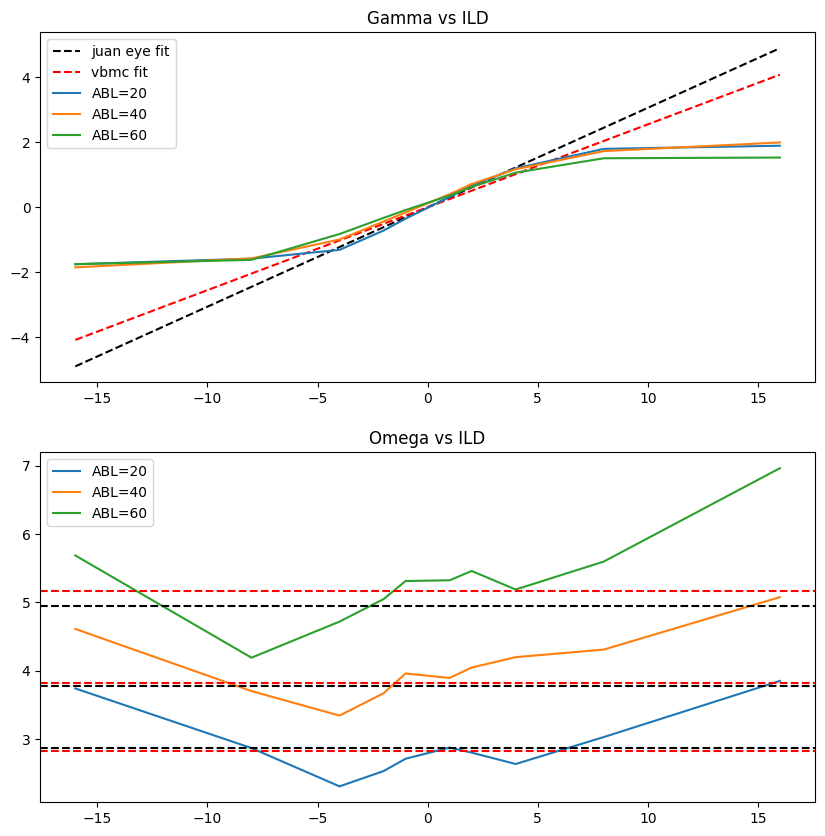

In [18]:
# rate_lambda = 0.118
# T_0 = 1/2220
# theta_E = 45

plt.figure(figsize=(10, 10))
plt.subplot(2, 1, 1)
plt.plot(all_ILD_sorted, calc_gamma_vs_ILD(juan_eye_fit_params), label='juan eye fit', ls='--', color='k')
plt.plot(all_ILD_sorted, calc_gamma_vs_ILD(vbmc_fit_params), label='vbmc fit', ls='--', color='r')
for a_idx, ABL in enumerate(all_ABL):
    plt.plot(all_ILD_sorted, gamma_vs_ILD_for_each_ABL[a_idx, :], label=f'ABL={ABL}')

    plt.title('Gamma vs ILD')
    plt.legend()


plt.subplot(2, 1, 2)
for a_idx, ABL in enumerate(all_ABL):
    plt.plot(all_ILD_sorted, omega_vs_ILD_for_each_ABL[a_idx, :], label=f'ABL={ABL}')
    
    plt.axhline(calc_omega_vs_ABL(juan_eye_fit_params, ABL), color='k', ls='--')
    plt.axhline(calc_omega_vs_ABL(vbmc_fit_params, ABL), color='r', ls='--')

    plt.title('Omega vs ILD')
    plt.legend()

